# Imports

In [10]:
import matplotlib.pyplot as plt 
import numpy as np 
import os
import pandas 
import matplotlib.lines as mlines

from scipy.interpolate import interp1d
import scipy.special as sc 
import scipy 

def getFilesInDirectory(directory_path, prefix = None):
    directory = os.fsencode(directory_path)
    files = []
    for file in os.listdir(directory):
        filename = os.fsdecode(file)
        if filename.endswith(".dat") or filename.endswith(".data"):
            if prefix is not None:
                if not filename.startswith(prefix):
                    continue 
            files.append(filename)
    return files

def createDummyLabels(plots, N):
    for i in range(N):
        p,  = plt.loglog(np.zeros(1), np.zeros(1), color='w', alpha=0, label=' ')
        plots.append(p)
        
masses = [1e-21, 1e-22, 1e-23]
standard_fdm_files = ['fc_cdm.dat', 'fc_m21.dat', 'fc_m22.dat', 'fc_m23.dat']
standard_files = ['fc_cdm.dat', 'fc_cdm_m21.dat', 'fc_cdm_m22.dat', 'fc_cdm_m23.dat']
standard_labels = ["CDM", r"$m = 10^{-21}$eV", r"$m = 10^{-22}$eV", r"$m = 10^{-23}$eV"]
colours = ["C0", "C1", "C2", "C3"]

dpi = 600
size=(3.54 * 1.5, 3.54)

plt.rcParams["font.size"] = 8
plt.rcParams['font.family'] = 'serif'
#plt.rcParams['font.serif'] = 'Ubuntu'
#plt.rcParams['font.monospace'] = 'Ubuntu Mono'
#plt.rcParams['axes.labelweight'] = 'bold'
plt.rcParams['figure.titlesize'] = 12

a0 = 0.01
z0 = 99
a1 = 1
zmean = 0.9

#Quantum jeans scale as function of scale factor and mass
#Equation (18) from Li 2020
def li_kj(a, m, omega_m = 0.315903, h = 0.67321170):
  return h*44.7*(6*a*omega_m/0.3)**(0.25) * (m/(1e-22))**0.5  #Mpc^-1

#For Lambda CDM
scale_factor, comoving_distance = np.loadtxt("splines/a2com.dat", unpack = True)
redshift = 1/scale_factor - 1
z2com = interp1d(redshift, comoving_distance, kind='cubic')

def q0(z0  = 0.9, beta = 1.5):
    q0m = (z0/beta) * sc.gamma(3/beta)
    return 1/q0m 

def q(z, z0  = 0.9, beta = 1.5):
    return q0(z0, beta) * (z/z0)**2 * np.exp(-(z/z0)**beta)

def k2t(z, k):
    com = z2com(z)
    lam = (2*np.pi)/k
    theta = np.arctan(lam/com)
    return theta


def k2ti(k):
    def integrand(z):
        return k2t(z, k)
    zl = 0.01 
    zh = 98
    return scipy.integrate.quad(integrand, zl, zh)[0]/(zh - zl)


def k2l(z, k):
    return 0.1 * np.pi / k2t(z, k)

def k2li(k):
    return np.pi / k2ti(k)

def lj(m):
    return k2l(zmean, li_kj(a0, m))

# Spectra

### Different axion masses

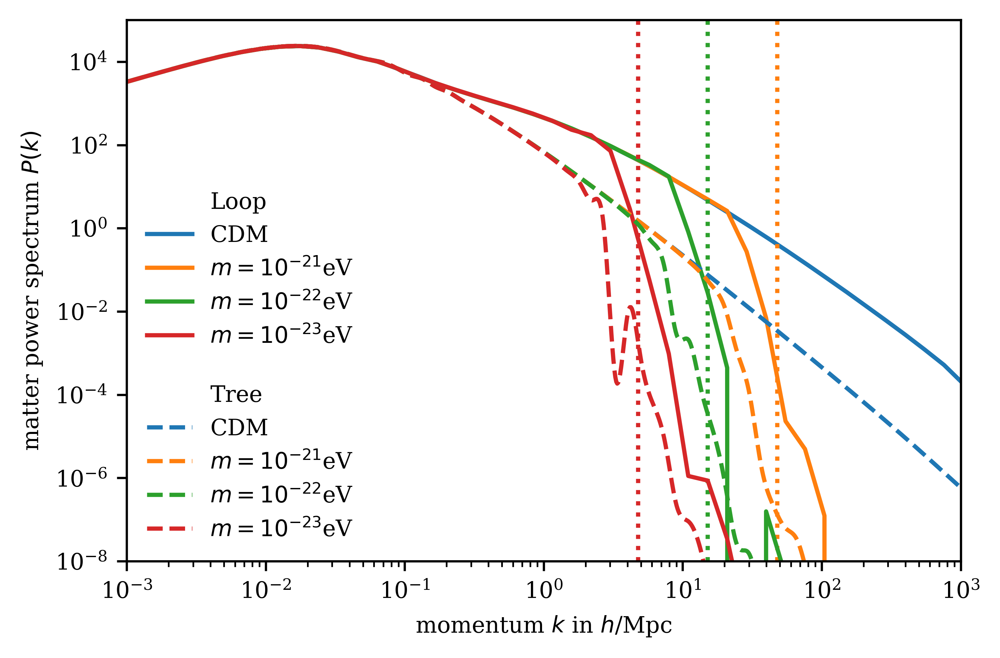

In [21]:
masses = [1e-21, 1e-22, 1e-23]
labels = ["CDM", r"$m = 10^{-21}$eV", r"$m = 10^{-22}$eV", r"$m = 10^{-23}$eV"]
a = 0.01

plt.figure(figsize=size, dpi = dpi)
plots = []


path = "data/spectrum/loop/"

p = mlines.Line2D([0], [0], color='steelblue', ls='--',lw=0, label='\nLoop')
plots.append(p)


for i, file in enumerate(standard_files):
    k,_, pt,_,_  = np.loadtxt(path +file, skiprows = 1, unpack = True)
    p,=plt.loglog(k, pt, label=labels[i])
    
    if i > 0:
        plt.axvline(li_kj(a, masses[i-1]), c=colours[i], ls = "dotted")
    plots.append(p)

path = "data/spectrum/tree/"


p = mlines.Line2D([0], [0], color='steelblue', ls='--',lw=0, label='\nTree')
plots.append(p)


for i, file in enumerate(standard_files):
    k, pt  = np.loadtxt(path + file, skiprows = 1, unpack = True)
    p, = plt.loglog(k, pt, label=labels[i], c=colours[i], ls = "dashed")
    plots.append(p)


leg = plt.legend(handles = plots, loc="lower left")
leg.get_frame().set_linewidth(0.0)
plt.ylabel("matter power spectrum $P(k)$")
plt.xlabel(r"momentum $k$ in $h$/Mpc")
plt.ylim([1e-8, 1e5])
plt.xlim([1e-3, 1e3])
plt.savefig("../figures/fdm_ic_matter_spectrum.pdf", bbox_inches='tight')
plt.show()

# Lensing spectra

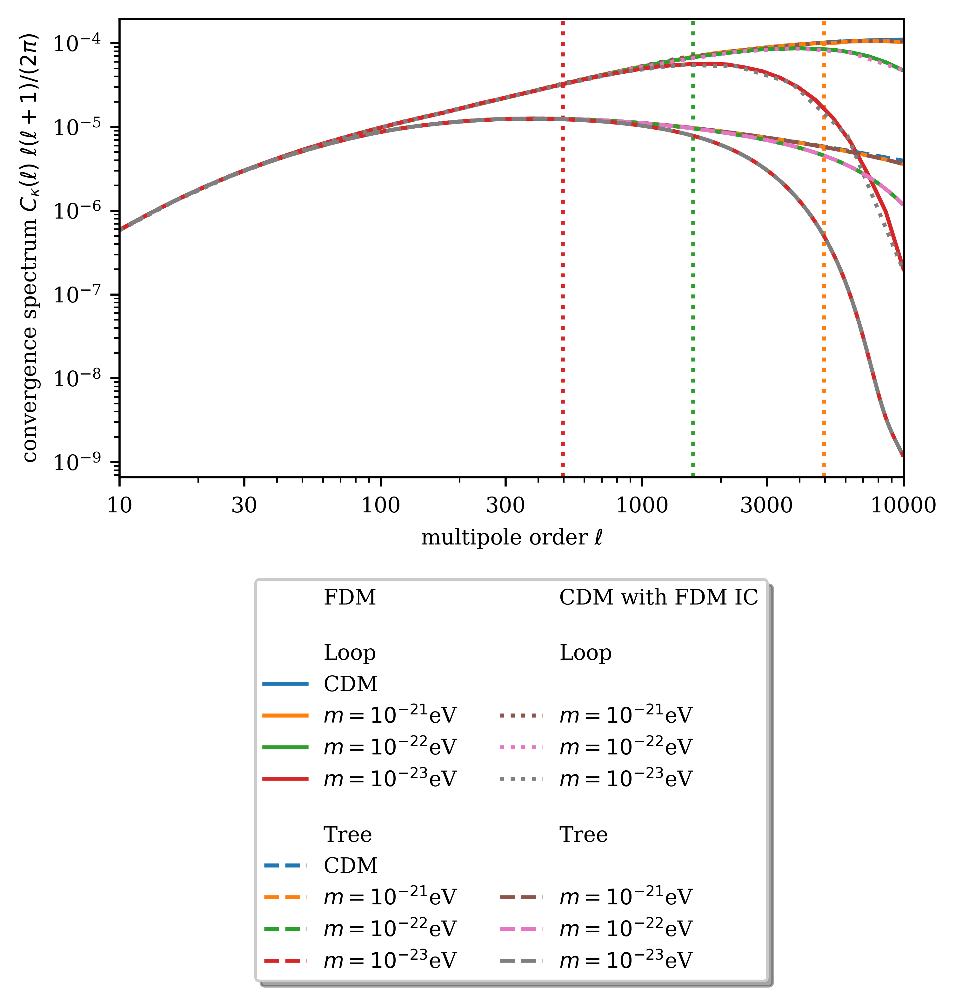

In [15]:
fig, ax = plt.subplots(figsize=size, dpi = dpi)


plots = []
p = mlines.Line2D([0], [0], color='steelblue', ls='--',lw=0, label='FDM')
plots.append(p)
p = mlines.Line2D([0], [0], color='steelblue', ls='--',lw=0, label='\nLoop')
plots.append(p)

path = "data/lensing_spectrum/loop/"
for i, file in enumerate(standard_fdm_files):
    l, Pk = np.loadtxt(path + file, unpack = True, skiprows=1)
    p, = plt.loglog(l, Pk * l * (l + 1) / (2*np.pi), label=standard_labels[i], c = colours[i], ls = "solid")
    plots.append(p)
    if i > 0:
        plt.axvline(lj(masses[i-1]), c=colours[i], ls = "dotted")




p = mlines.Line2D([0], [0], color='steelblue', ls='--',lw=0, label='\nTree')
plots.append(p)

path = "data/lensing_spectrum/"
files = ["kappa_1_fc_cdm.dat", "kappa_1_fc_m21.dat", "kappa_1_fc_m22.dat", "kappa_1_fc_m23.dat"]
for i, file in enumerate(files):
    l, Pk = np.loadtxt(path + file, unpack = True)
    p, = plt.loglog(l, Pk * l * (l + 1) / (2*np.pi), label=standard_labels[i], c = colours[i], ls="dashed")
    plots.append(p)


p = mlines.Line2D([0], [0], color='steelblue', ls='--',lw=0, label='CDM with FDM IC')
plots.append(p)

p = mlines.Line2D([0], [0], color='steelblue', ls='--',lw=0, label='\nLoop')
plots.append(p)

createDummyLabels(plots, 1)
path = "data/lensing_spectrum/loop/"
files = ["fc_cdm_m21.dat", "fc_cdm_m22.dat", "fc_cdm_m23.dat"]
for i, file in enumerate(files):
    l, Pk = np.loadtxt(path + file, unpack = True, skiprows=1)
    p, = plt.loglog(l, Pk * l * (l + 1) / (2*np.pi), label=standard_labels[i+1], c = f"C{i+5}", ls="dotted")
    plots.append(p)

p = mlines.Line2D([0], [0], color='steelblue', ls='--',lw=0, label='\nTree')
plots.append(p)
createDummyLabels(plots, 1)

path = "data/lensing_spectrum/"
files = ["kappa_1_fc_cdm_m21.dat", "kappa_1_fc_cdm_m22.dat", "kappa_1_fc_cdm_m23.dat"]
for i, file in enumerate(files):
    l, Pk = np.loadtxt(path + file, unpack = True, skiprows=1)
    p, = plt.loglog(l, Pk * l * (l + 1) / (2*np.pi), label=standard_labels[i+1], c = f"C{i+5}", ls="dashed")
    plots.append(p)



plt.xlim(10, 10000)
aux = [10, 30,100,300,1000,3000,10000]
plt.xticks(aux,aux)


# Shrink current axis's height by 10% on the bottom
box = ax.get_position()
ax.set_position([box.x0, box.y0 + box.height * 0.1,
                 box.width, box.height * 0.9])

# Put a legend below current axis
ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2),handles = plots,
          fancybox=True, shadow=True, ncol=2)

plt.ylabel(r"convergence spectrum $C_{\kappa}(\ell)$ $\ell(\ell+1)/(2\pi)$")
plt.xlabel(r"multipole order $\ell$")
plt.savefig("../figures/fdm_ic_convergence_spectrum.pdf", bbox_inches='tight')
plt.show()

# Tree-level bispectra

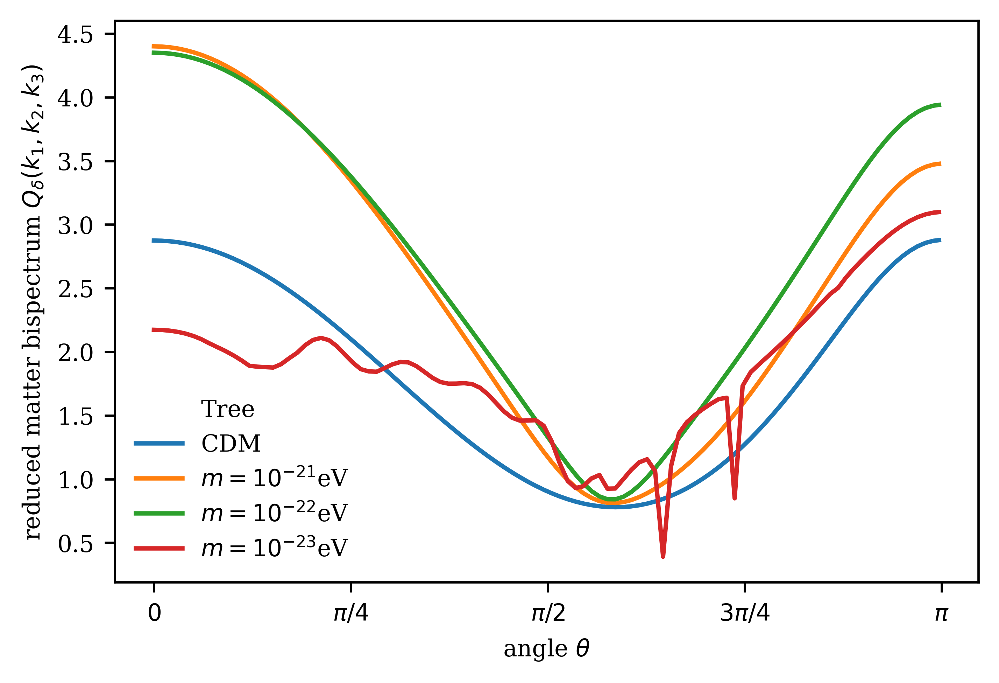

In [6]:


configs = ["r1=20_r2=10"]
titles = [r"for $k_1$ = $0.2$ $h$/Mpc and $k_2$ = $0.1$ $h$/Mpc", r"for $k_1$ = $20$ $h$/Mpc and $k_2$ = $10$ $h$/Mpc"]


fig, ax = plt.subplots(figsize=size, dpi=dpi)

xticks = [0, np.pi/4, np.pi/2, 3*np.pi/4, np.pi]
xlabels = ["$0$", "$\pi/4$", "$\pi/2$", "$3\pi/4$", "$\pi$"]


plots = []

p = mlines.Line2D([0], [0], color='steelblue', ls='--',lw=0, label='Tree')
plots.append(p)
for i, config in enumerate(configs):
    path = "data/bispectrum/angular/tree/"
    files = ['fc_cdm_'+config+'.dat', 'fc_m21_'+config+'.dat', 'fc_m22_'+config+'.dat', 'fc_m23_'+config+'.dat']
    labels = ["CDM", "$m = 10^{-21}$eV", "$m = 10^{-22}$eV", "$m = 10^{-23}$eV"]
    for j, file in enumerate(files):
        theta, bt, btr = np.loadtxt(path + file, skiprows = 1, unpack = True)
        p, = ax.plot(theta, btr, label=labels[j], c = colours[j])
        plots.append(p)

    #path = "data/bispectrum/angular/loop/"
    #files = ['cdm_'+config+'.dat', 'fdm_m21_'+config+'.dat', 'fdm_m22_'+config+'.dat', 'fdm_m23_'+config+'.dat']
    #labels = ["Loop CDM", "Loop $m = 10^{-21}$eV", "Loop $m = 10^{-22}$eV", "Loop $m = 10^{-23}$eV"]#, "Loop $m = 10^{-21}$eV", , "Loop $m = 10^{-23}$eV"]
#
    #for j, file in enumerate(files):
    #    theta, btr, bnlr, sdev = np.loadtxt(path + file, skiprows = 1, unpack = True)
    #    plt.plot(theta, btr + bnlr, label=labels[j], c = colours[j])
##
    #    plt.fill_between(theta, btr + bnlr + sdev, btr + bnlr - sdev, color = colours[j], alpha = 0.5)

    ax.set_xticks(xticks, xlabels)

leg = ax.legend(handles = plots, loc="lower left")
leg.get_frame().set_linewidth(0.0)
ax.set_ylabel("reduced matter bispectrum $Q_{\delta}(k_1, k_2, k_3)$ ")
ax.set_xlabel(r"angle $\theta$")
plt.subplots_adjust(wspace=0)
plt.savefig(f"../figures/angular_matter_bispectrum.pdf", bbox_inches='tight')
plt.show()

## Equilateral reduced bispetrum

FileNotFoundError: data/bispectrum/equilateral/tree/cdm.dat not found.

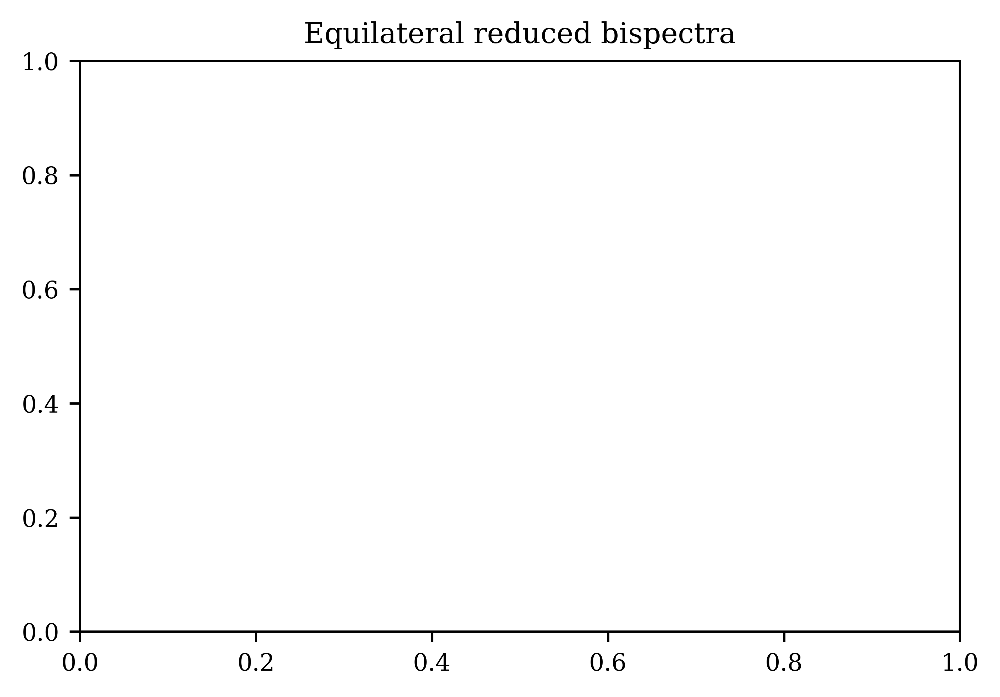

In [7]:
plt.figure(figsize=size, dpi = dpi)
plt.title(r"Equilateral reduced bispectra")

path = "data/bispectrum/equilateral/tree/"
files = ['cdm.dat', 'fdm_m21.dat', 'fdm_m22.dat', 'fdm_m23.dat']
labels = ["Tree CDM", "Tree $m = 10^{-21}$eV", "Tree $m = 10^{-22}$eV", "Tree $m = 10^{-23}$eV"]
for file, label in zip(files, labels):
    theta, p, b, bdimless, bred, brederr, q = np.loadtxt(path + file, skiprows = 1, unpack = True)
    plt.plot(theta, bred, label=label)

path = "data/bispectrum/equilateral/loop/reduced/"
files = ['cdm_loop.dat']
labels = ["CDM"]
plt.xscale("log")
for file, label in zip(files, labels):
    theta, btr, bnlr, sdev = np.loadtxt(path + file, skiprows = 1, unpack = True)
    print(theta)
    #plt.plot(theta, btr,        label="Tree " + label)
    plt.plot(theta, btr + bnlr, label="Loop " + label)

    plt.fill_between(theta, btr + bnlr + sdev, btr + bnlr - sdev, alpha = 0.5)

leg = plt.legend(loc="lower left")
leg.get_frame().set_linewidth(0.0)
plt.ylabel("$Q(k, k, k)$")
plt.xlabel(r"Momentum $k$ in $h$/Mpc")
plt.show()

## Equilateral dimensionless bispectrum

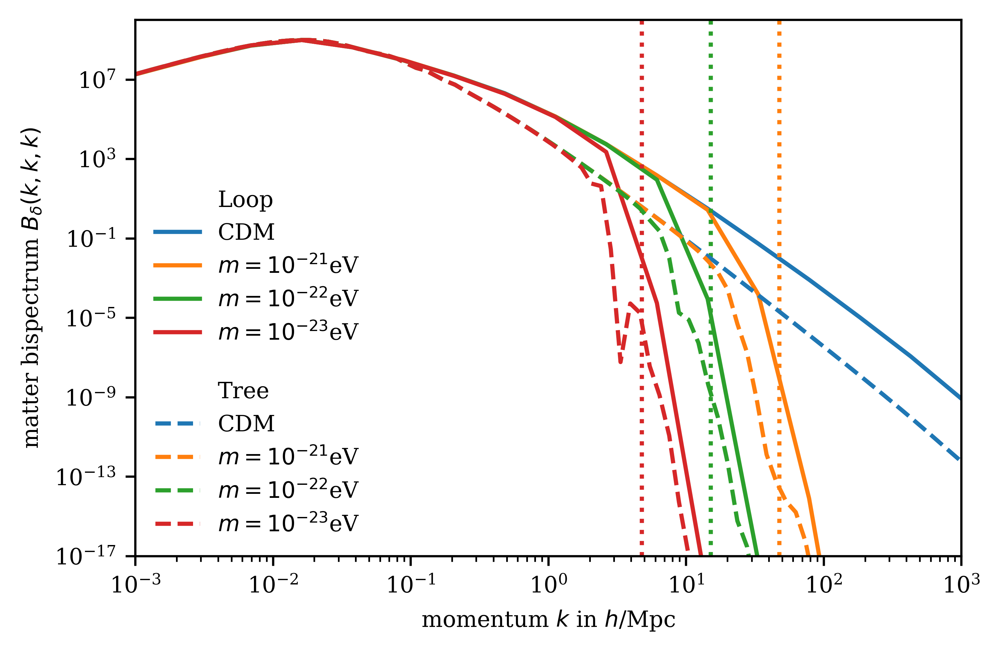

In [4]:


plt.figure(figsize=size, dpi = dpi)
plt.ylabel(r"matter bispectrum $B_{\delta}(k, k, k)$")
plt.xlabel(r"momentum $k$ in $h$/Mpc")

a = 0.01

plots = []
p = mlines.Line2D([0], [0], color='steelblue', ls='--',lw=0, label='Loop')
plots.append(p)

path = "data/bispectrum/equilateral/loop/"
for i, file in enumerate(standard_files):
    k, P, B, BR, R, E, Q = np.loadtxt(path + file, unpack = True, skiprows=1)
    p,=plt.loglog(k, B, label=standard_labels[i], c=colours[i])
    if i > 0:
        plt.axvline(li_kj(a, masses[i-1]), c=colours[i], ls = "dotted")
    plots.append(p)

p = mlines.Line2D([0], [0], color='steelblue', ls='--',lw=0, label='\nTree')
plots.append(p)

path = "data/bispectrum/equilateral/tree/"
for i, file in enumerate(standard_files):
    k, P, B, BR, R, E, Q = np.loadtxt(path + file, unpack = True, skiprows=1)
    p,=plt.loglog(k, B, label=standard_labels[i], c=colours[i], ls = "dashed")
    plots.append(p)

#path = "data/bispectrum/equilateral/loop/"
#
#files = ['cdm_loop.dat', 'fdm_loop_m21.dat', 'fdm_loop_m22.dat', 'fdm_loop_m23.dat']
#labels = ["Loop CDM", "Loop $m = 10^{-21}$eV", "Loop $m = 10^{-22}$eV", "Loop $m = 10^{-23}$eV"]
#
#for i, file in enumerate(files):
#    k, P, B, BR, R, E, Q = np.loadtxt(path + file, unpack = True, skiprows=1)
#    plt.loglog(k, B, label=labels[i], c=colours[i])

plt.xlim(1e-3, 1000)
plt.ylim(1e-17, 1e10)
leg = plt.legend(handles = plots, loc="lower left")
leg.get_frame().set_linewidth(0.0)
plt.savefig("../figures/equilateral_matter_bispectrum.pdf", bbox_inches='tight')
plt.show()

# Lensing bispectrum

In [9]:
import matplotlib.pyplot as plt
from matplotlib import cm
import mpl_toolkits.mplot3d as a3
import pandas
import numpy as np

def disable_ticks(ax):
    ax.xaxis.set_ticklabels([])
    ax.yaxis.set_ticklabels([])
    ax.zaxis.set_ticklabels([])

    for line in ax.xaxis.get_ticklines():
        line.set_visible(False)
    for line in ax.yaxis.get_ticklines():
        line.set_visible(False)
    for line in ax.zaxis.get_ticklines():
        line.set_visible(False)

def disable_xyticks(ax):
    ax.xaxis.set_ticklabels([])
    ax.yaxis.set_ticklabels([])

    for line in ax.xaxis.get_ticklines():
        line.set_visible(False)
    for line in ax.yaxis.get_ticklines():
        line.set_visible(False)

def disable_zticks(ax):
    ax.zaxis.set_ticklabels([])

    for line in ax.zaxis.get_ticklines():
        line.set_visible(False)

def plot_bispectrum_s2n(filename, title, subtitles, runs, subsubtitles, lcs = 1e9, lcc = 1e9, rcs = 1e5, rcc = 1e4):
    low = 1
    high = 4

    vtx1 = np.array([[high, high, low], [low,  high, high], [low, low,  low]])
    vtx2 = np.array([[high, high, low], [high, low , high],  [low, low,  low]])
    vtx3 = np.array([[high,  low, high], [low, high, high], [low, low,  low]])


    aux1 = np.log10(np.array([10, 100,1000,10000]))
    aux2 = np.array([10,100,1000,10000])

    cmap = cm.inferno

    fig, axes   = plt.subplots(3, 2, subplot_kw={"projection": "3d"})
    fig.set_size_inches(size[0], 1.5*size[0])
    fig.set_dpi(dpi)
    for i, x in enumerate(zip(subtitles, runs)):
        title, data = x
        ax = axes[i][0]
        #ax.set_title(subsubtitles[i][0])
        surf      = ax.scatter(np.log10(data["l1"]),np.log10(data["l2"]), np.log10(data["l3"]), s=data["BKS"]*lcs, c=data["BKS"] * lcc, cmap=cmap)
        tri       = a3.art3d.Poly3DCollection([vtx1])
        tri.set_color("white")
        tri.set_edgecolor('gray')
        ax.add_collection3d(tri)
        if i == 2:
            ax.set_xlabel("$\ell_1$")
            ax.set_ylabel("$\ell_2$")
        ax.set_zlabel("$\ell_3$")
        ax.set_xticks(aux1)
        ax.set_xticklabels(aux2)
        ax.set_yticks(aux1)
        ax.set_yticklabels(aux2)
        ax.set_zticks([])
        #ax.set_zticklabels(aux2)

        ax = axes[i][1]
        #ax.set_title(subsubtitles[i][1])
        surf      = ax.scatter(np.log10(data["l1"]), np.log10(data["l2"]), np.log10(data["l3"]), s=data["S2N"]*rcs, c=data["S2N"]*rcc, cmap=cmap)
        tri       = a3.art3d.Poly3DCollection([vtx1])
        tri.set_color("white")
        tri.set_edgecolor('gray')
        ax.add_collection3d(tri)
        if i == 2:
            ax.set_xlabel("$\ell_1$")
            ax.set_ylabel("$\ell_2$")
        ax.set_zlabel("$\ell_3$")
        ax.set_xticks(aux1)
        ax.set_xticklabels(aux2)
        ax.set_yticks(aux1)
        ax.set_yticklabels(aux2)
        ax.set_zticks(aux1)
        ax.set_zticklabels(aux2)
        #disable_ticks(ax)
    plt.subplots_adjust(hspace=0.1)
    plt.subplots_adjust(wspace=0.1)
    #plt.figtext(0.52, 0.91, subtitles[0], ha='center', va='center', fontsize="large")
    #plt.figtext(0.52, 0.64, subtitles[1], ha='center', va='center', fontsize="large")
    #plt.figtext(0.52, 0.36, subtitles[2], ha='center', va='center', fontsize="large")
    plt.savefig("../figures/convergence_bispectrum_3d_"+filename+".pdf", bbox_inches='tight')
    plt.show()


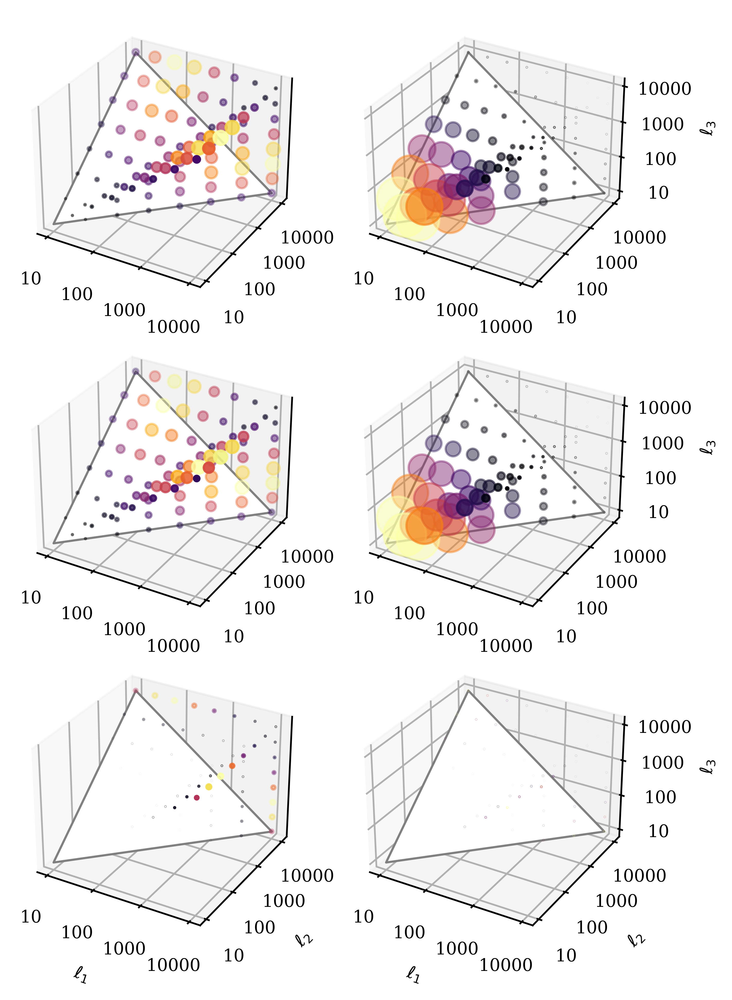

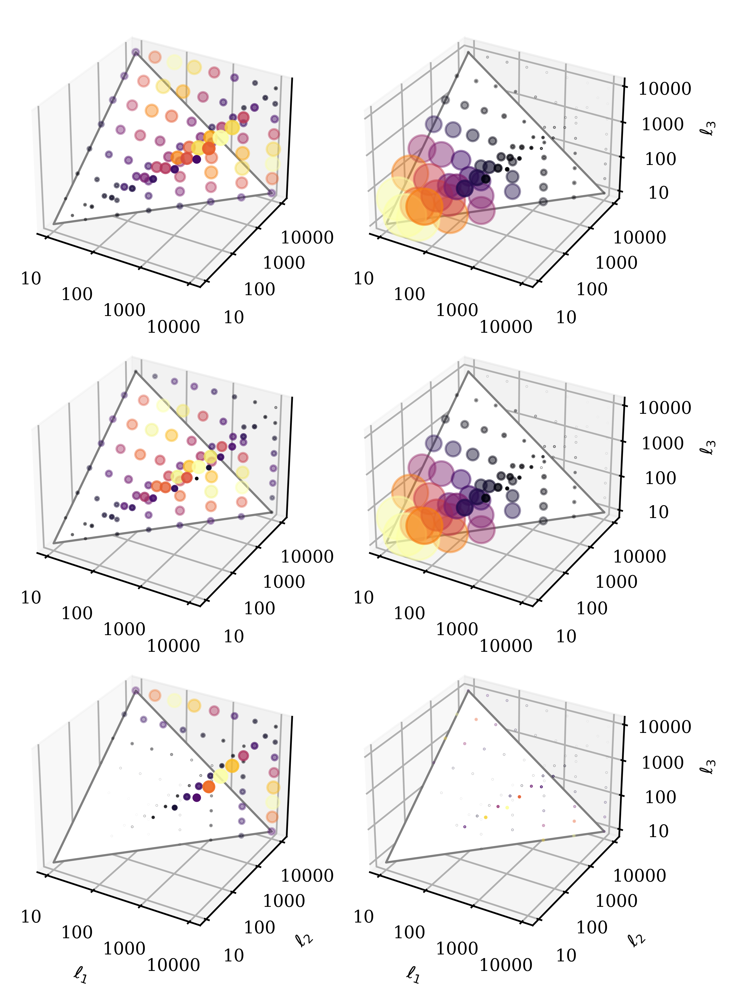

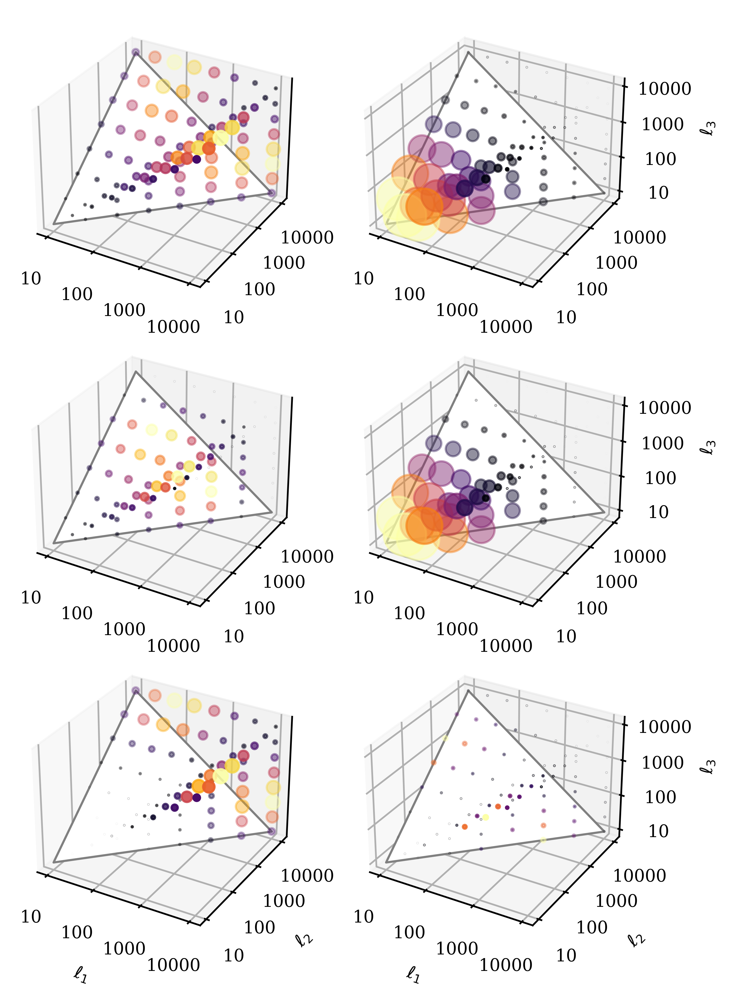

In [10]:
path = "data/lensing_bispectrum/3d/tree/"
masses = ["21", "22", "23"]
for m in masses:
    mass_string = "$m = 10^{-"+m+"}$eV"

    title = "Comparison of CDM and FDM ("+m+") convergence bispectra S2N-ratios"
    subtitles = standard_labels
    subsubtitles = [
        [r"$(\ell_1 \ell_2 \ell_3)^{4/3} B^{CDM}_{\kappa}(\ell_1, \ell_2, \ell_3)$", r"$B^{CDM}_{\kappa}(\ell_1, \ell_2, \ell_3) / \sqrt{cov^{CDM}(\ell_1, \ell_2, \ell_3)}$"],
        [r"$(\ell_1 \ell_2 \ell_3)^{4/3} B^{FDM}_{\kappa}(\ell_1, \ell_2, \ell_3)$", r"$B^{FDM}_{\kappa}(\ell_1, \ell_2, \ell_3) / \sqrt{cov^{FDM}(\ell_1, \ell_2, \ell_3)}$"],
        [r"$(\ell_1 \ell_2 \ell_3)^{4/3} |B^{CDM}_{\kappa}(\ell_1, \ell_2, \ell_3) - B^{FDM}_{\kappa}(\ell_1, \ell_2, \ell_3)|$", r"$|B^{CDM}_{\kappa}(\ell_1, \ell_2, \ell_3) - B^{FDM}_{\kappa}(\ell_1, \ell_2, \ell_3)| / \sqrt{cov^{CDM}(\ell_1, \ell_2, \ell_3)}$"]
    ]

    files = ["fc_cdm.dat", f"fc_m{m}.dat"]
    runs = []
    for file, label in zip(files, subtitles):
        data = pandas.read_csv(path + file, delim_whitespace=True, skiprows=[0])
        data.columns = ["l1", "l2", "l3", "B_k", "BKS", "Cov", "S2N"]
        (data["S2N"])[data["S2N"] == -1] = 0
        runs.append(data)

    subtitles.append("|CDM - $m = 10^{-22} eV$|")
    cdm =  runs[0].copy()
    fdm =  runs[1].copy()
    diff = runs[0].copy()
    diff["B_k"] = np.abs(cdm["B_k"] - fdm["B_k"])
    diff["BKS"] = np.abs(cdm["BKS"] - fdm["BKS"])
    diff["S2N"] = diff["B_k"] / np.sqrt(diff["Cov"])
    

    runs.append(diff)
    
    plot_bispectrum_s2n("fc_m"+m, title, subtitles, runs, subsubtitles, lcs = 5e7, lcc = 5e7)

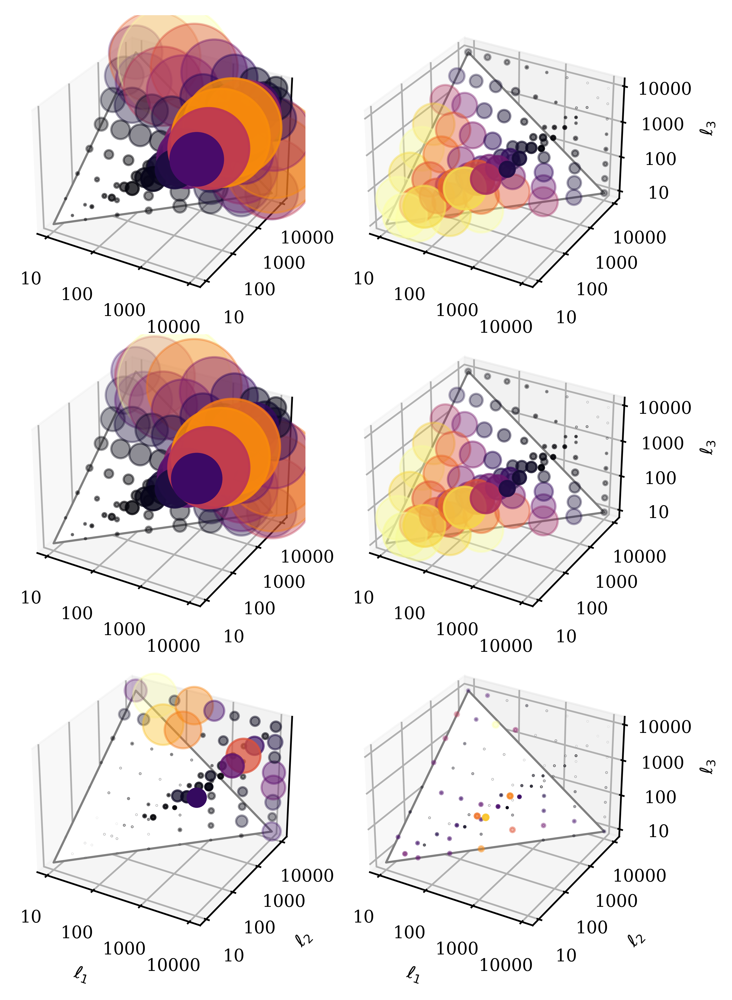

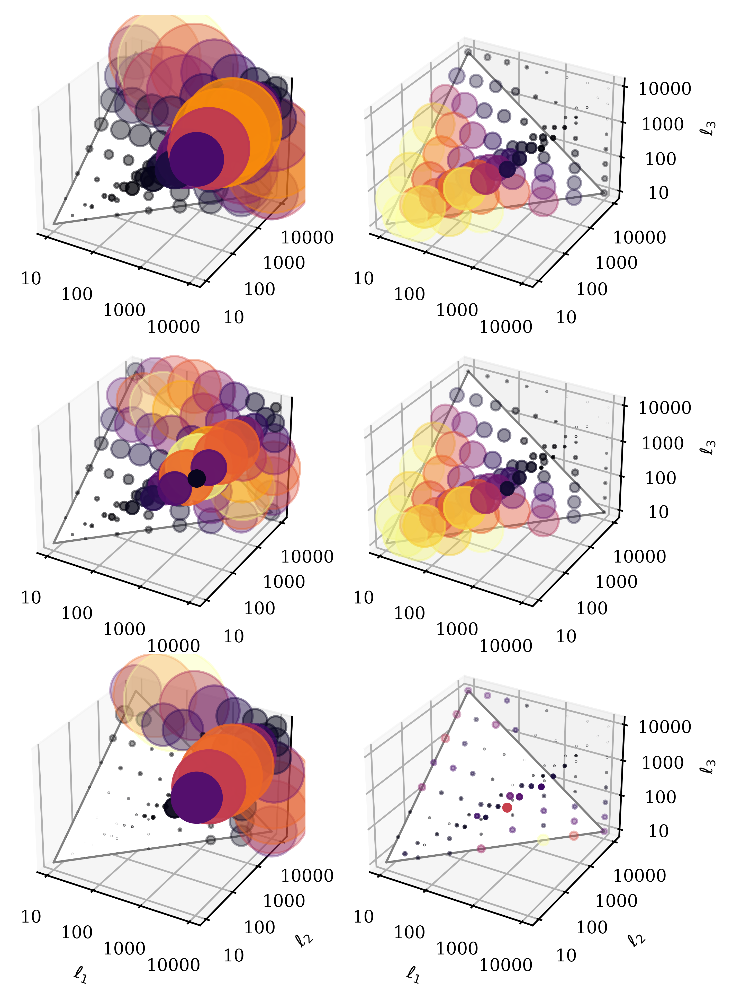

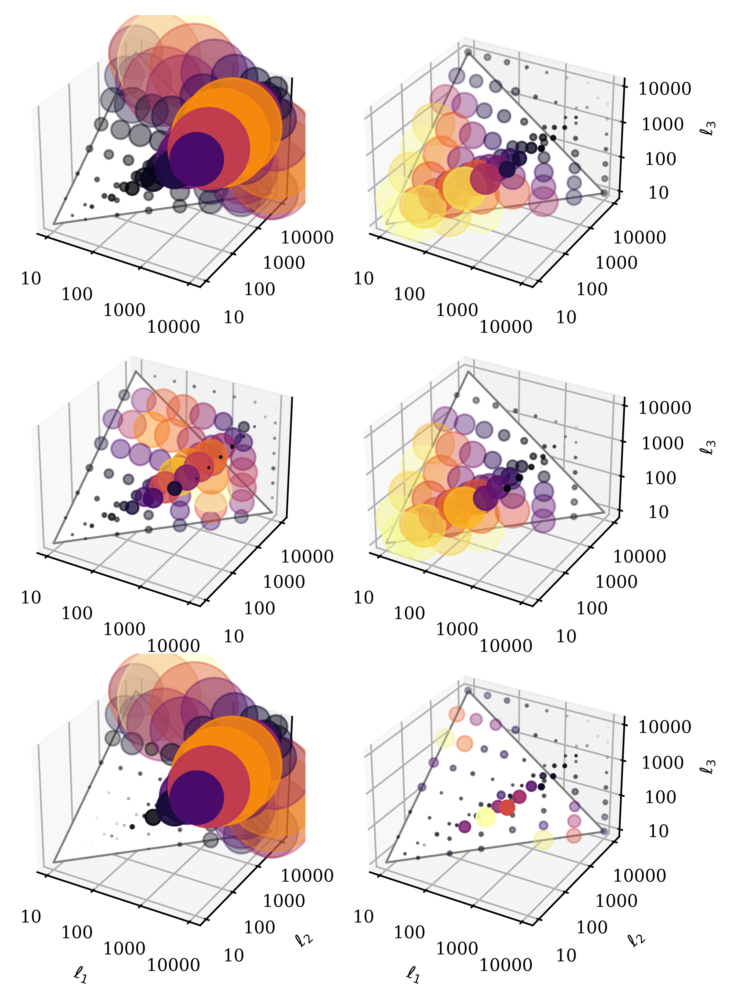

In [11]:
path = "data/lensing_bispectrum/3d/loop/"
masses = ["21", "22", "23"]
for m in masses:
    mass_string = "$m = 10^{-"+m+"}$eV"

    title = "Comparison of CDM and FDM ("+m+") convergence bispectra S2N-ratios"
    subtitles = standard_labels
    subsubtitles = [
        [r"$(\ell_1 \ell_2 \ell_3)^{4/3} B^{CDM}_{\kappa}(\ell_1, \ell_2, \ell_3)$", r"$B^{CDM}_{\kappa}(\ell_1, \ell_2, \ell_3) / \sqrt{cov^{CDM}(\ell_1, \ell_2, \ell_3)}$"],
        [r"$(\ell_1 \ell_2 \ell_3)^{4/3} B^{FDM}_{\kappa}(\ell_1, \ell_2, \ell_3)$", r"$B^{FDM}_{\kappa}(\ell_1, \ell_2, \ell_3) / \sqrt{cov^{FDM}(\ell_1, \ell_2, \ell_3)}$"],
        [r"$(\ell_1 \ell_2 \ell_3)^{4/3} |B^{CDM}_{\kappa}(\ell_1, \ell_2, \ell_3) - B^{FDM}_{\kappa}(\ell_1, \ell_2, \ell_3)|$", r"$|B^{CDM}_{\kappa}(\ell_1, \ell_2, \ell_3) - B^{FDM}_{\kappa}(\ell_1, \ell_2, \ell_3)| / \sqrt{cov^{CDM}(\ell_1, \ell_2, \ell_3)}$"]
    ]

    files = ["fc_cdm.dat", f"fc_cdm_m{m}.dat"]
    runs = []
    for file, label in zip(files, subtitles):
        data = pandas.read_csv(path + file, delim_whitespace=True, skiprows=[0])
        data.columns = ["l1", "l2", "l3", "B_k", "BKS", "Cov", "S2N"]
        (data["S2N"])[data["S2N"] == -1] = 0
        runs.append(data)

    subtitles.append("|CDM - $m = 10^{-22} eV$|")
    cdm =  runs[0].copy()
    fdm =  runs[1].copy()
    diff = runs[0].copy()
    diff["B_k"] = np.abs(cdm["B_k"] - fdm["B_k"])
    diff["BKS"] = np.abs(cdm["BKS"] - fdm["BKS"])
    diff["S2N"] = diff["B_k"] / np.sqrt(diff["Cov"])
    

    runs.append(diff)
    
    plot_bispectrum_s2n("fc_cdm_m"+m, title, subtitles, runs, subsubtitles, lcs = 5e7, lcc = 5e7)

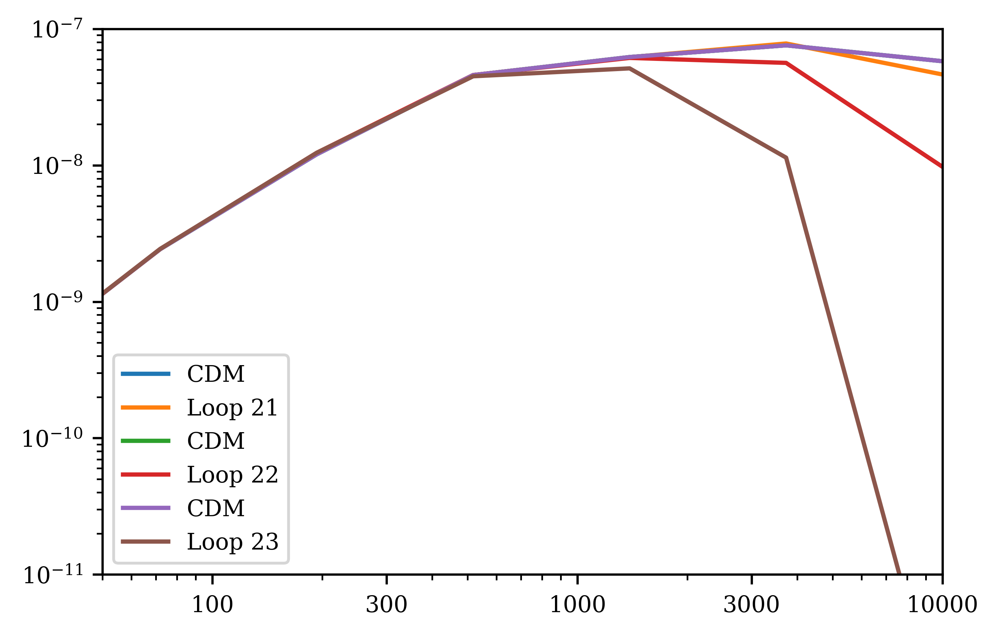

In [12]:
path = "data/lensing_bispectrum/3d/loop/"
masses = ["21", "22", "23"]
plt.figure(figsize=size, dpi=dpi)
for m in masses:
    mass_string = "$m = 10^{-"+m+"}$eV"

    files = ["fc_cdm.dat", f"fc_cdm_m{m}.dat"]
    labels = ["CDM", "Loop "+m]

    for i, file in enumerate(files):
        data = pandas.read_csv(path + file, delim_whitespace=True, skiprows=[0])
        data.columns = ["l1", "l2", "l3", "B_k", "BKS", "Cov", "S2N"]
        c1 = data["l1"] == data["l2"]
        c2 = data["l2"] == data["l3"]
        c3 = data["l1"] == data["l3"]

        equilateral = data[c1 & c2 & c3]

        plt.loglog(equilateral["l1"], equilateral["B_k"] * equilateral["l1"]**4/(2*np.pi)**2, label = labels[i])

aux = [10, 30,100,300,1000,3000,10000]
plt.xticks(aux,aux)
plt.xlim(10, 10000)
plt.xlim(50, 10000)
plt.ylim(1e-11, 1e-7)
plt.legend()

## Dimensionless equilateral lensing bispectrum 

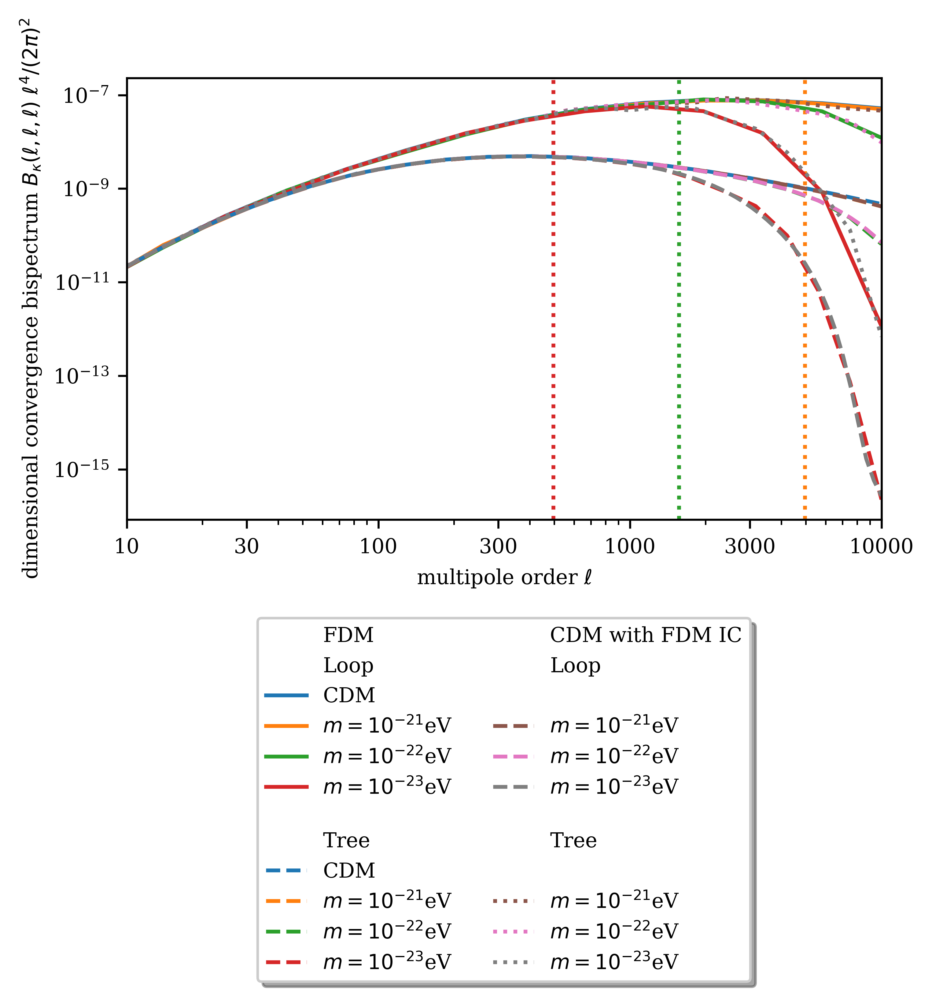

In [25]:
path1 = "data/lensing_bispectrum/equilateral/"

fig, ax = plt.subplots(figsize=size, dpi = dpi)

plots = []

files =  ['fc_cdm_loop.dat', 'fc_m21_loop.dat', 'fc_m22_loop.dat', 'fc_m23_loop.dat']

p = mlines.Line2D([0], [0], color='steelblue', ls='--',lw=0, label='FDM')
plots.append(p)
p = mlines.Line2D([0], [0], color='steelblue', ls='--',lw=0, label='Loop')
plots.append(p)

for i, file in enumerate(files):
    l, Bk = np.loadtxt(path1 + file, unpack = True, skiprows=1)
    p, = plt.loglog(l, Bk * l**4 / (2*np.pi)**2, label=standard_labels[i], c=colours[i])
    plots.append(p)
    if i > 0:
        plt.axvline(lj(masses[i-1]), c=colours[i], ls = "dotted")


p = mlines.Line2D([0], [0], color='steelblue', ls='--',lw=0, label='\nTree')
plots.append(p)

files = ['fc_cdm_tree.dat', 'fc_m21_tree.dat', 'fc_m22_tree.dat', 'fc_m23_tree.dat']

for i, file in enumerate(files):
    l, Bk = np.loadtxt(path1 + file, unpack = True, skiprows=1)
    p, = plt.loglog(l, Bk * l**4 / (2*np.pi)**2, label=standard_labels[i], c=colours[i], ls = "dashed")
    plots.append(p)

path = "data/lensing_bispectrum/equilateral/"
p = mlines.Line2D([0], [0], color='steelblue', ls='--',lw=0, label='CDM with FDM IC')
plots.append(p)
p = mlines.Line2D([0], [0], color='steelblue', ls='--',lw=0, label='Loop')
plots.append(p)
createDummyLabels(plots, 1)

files = ["fc_cdm_m21_tree.dat", "fc_cdm_m22_tree.dat", "fc_cdm_m23_tree.dat"]
for i, file in enumerate(files):
    l, Bk = np.loadtxt(path + file, unpack = True, skiprows=1)
    p, = plt.loglog(l, Bk * l**4 / (2*np.pi)**2, c = f"C{i+5}", label=standard_labels[i+1], ls = "dashed")
    plots.append(p)

p = mlines.Line2D([0], [0], color='steelblue', ls='--',lw=0, label='\nTree')
plots.append(p)
createDummyLabels(plots, 1)

files = ["fc_cdm_m21_loop.dat", "fc_cdm_m22_loop.dat", "fc_cdm_m23_loop.dat"]
for i, file in enumerate(files):
    l, Bk = np.loadtxt(path + file, unpack = True, skiprows=1)
    p, = plt.loglog(l, Bk * l**4 / (2*np.pi)**2, c = f"C{i+5}", label=standard_labels[i+1], ls="dotted")
    plots.append(p)



plt.xlabel(r"multipole order $\ell$")
plt.ylabel(r"dimensional convergence bispectrum $B_{\kappa}(\ell, \ell, \ell)$ $\ell^4/(2\pi)^2$")


aux = [10, 30,100,300,1000,3000,10000]
plt.xticks(aux,aux)
plt.xlim(10, 10000)


# Shrink current axis's height by 10% on the bottom
box = ax.get_position()
ax.set_position([box.x0, box.y0 + box.height * 0.1,
                 box.width, box.height * 0.9])


# Put a legend below current axis
ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2),handles = plots,
          fancybox=True, shadow=True, ncol=2)

          
leg.get_frame().set_linewidth(0.0)
plt.savefig("../figures/fdm_ic_equilateral_convergence_bispectrum.pdf", bbox_inches='tight')
plt.show()

# Equilateral Trispectrum

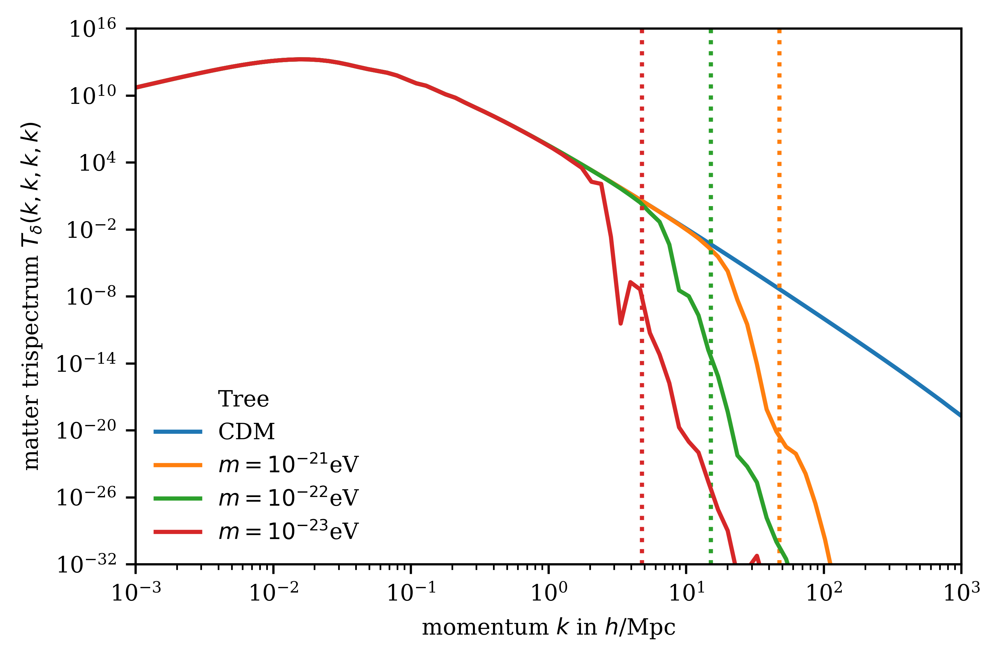

In [28]:
plt.figure(figsize=size, dpi = dpi)
plt.ylabel(r"matter trispectrum $T_{\delta}(k, k, k, k)$")
plt.xlabel(r"momentum $k$ in $h$/Mpc")

a = 0.01
path = "data/trispectrum/equilateral/"
files = ["fc_cdm.dat", "fc_m21.dat", "fc_m22.dat", "fc_m23.dat"]

plots = []

p = mlines.Line2D([0], [0], color='steelblue', ls='--',lw=0, label='Tree')
plots.append(p)


for i, file in enumerate(standard_files):
    k, T = np.loadtxt(path + file, unpack = True, skiprows=1)
    p, = plt.loglog(k, T, label=standard_labels[i], c=colours[i])
    if i > 0:
        plt.axvline(li_kj(a, masses[i-1]), c=colours[i], ls = "dotted")
    plots.append(p)

plt.xlim(1e-3, 1000)
plt.ylim(1e-32, 1e16)
leg = plt.legend(handles = plots, loc="lower left")
leg.get_frame().set_linewidth(0.0)
plt.savefig("../figures/fdm_ic_equilateral_matter_trispectrum.pdf", bbox_inches='tight')
plt.show()


# Lensing Trispectrum

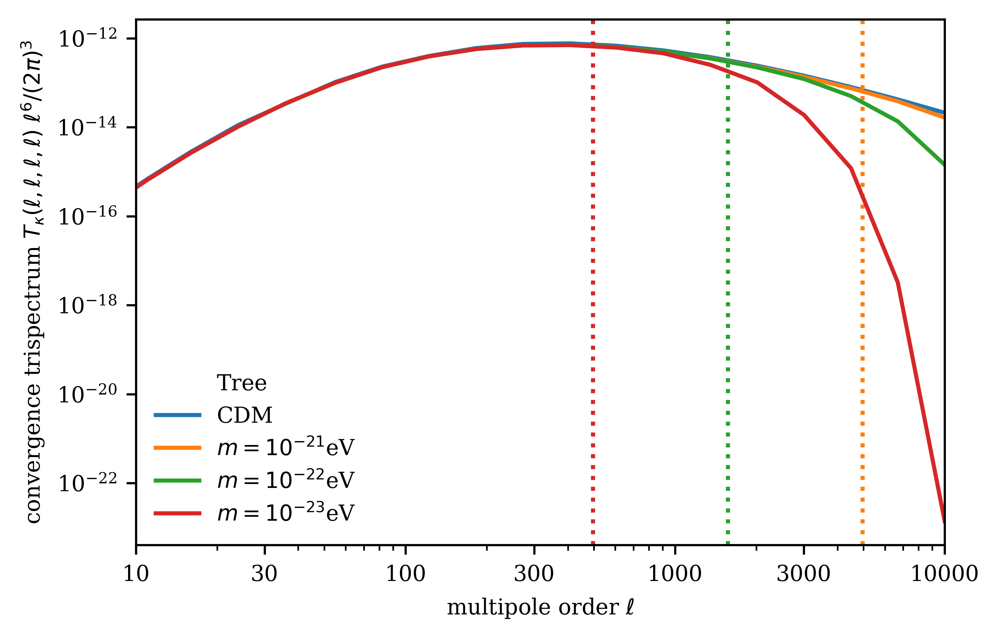

In [18]:
plt.figure(figsize=size, dpi=dpi)
import seaborn as sns 
path = "data/lensing_trispectrum/equilateral/"


plots = []

p = mlines.Line2D([0], [0], color='steelblue', ls='--',lw=0, label='Tree')
plots.append(p)



path = "../../C/data/lensing_trispectrum/equilateral/"

files = ['cdm.dat', 'fdm_m21.dat', 'fdm_m22.dat', 'fdm_m23.dat']
labels = ["CDM", "$m = 10^{-21}$eV", "$m = 10^{-22}$eV", "$m = 10^{-23}$eV"]

for i, file in enumerate(files):
    l, Tk = np.loadtxt(path + file, unpack = True, skiprows=1)
    p, = plt.loglog(l, Tk * l**6 / (2*np.pi)**3, label=labels[i], c = colours[i])
    plots.append(p)
    if i > 0:
        plt.axvline(k2l(zmean, li_kj(a0, masses[i-1])), c=colours[i], ls = "dotted")


plt.xlabel(r"multipole order $\ell$")
plt.ylabel(r"convergence trispectrum $T_{\kappa}(\ell, \ell, \ell, \ell)$ $\ell^6/(2\pi)^3$")
aux = [10, 30,100,300,1000,3000,10000]
plt.xticks(aux,aux)
plt.xlim(10, 10000)
leg = plt.legend(handles = plots, loc="lower left")
leg.get_frame().set_linewidth(0.0)

plt.savefig("../figures/equilateral_convergence_trispectrum.pdf", bbox_inches='tight')
plt.show()


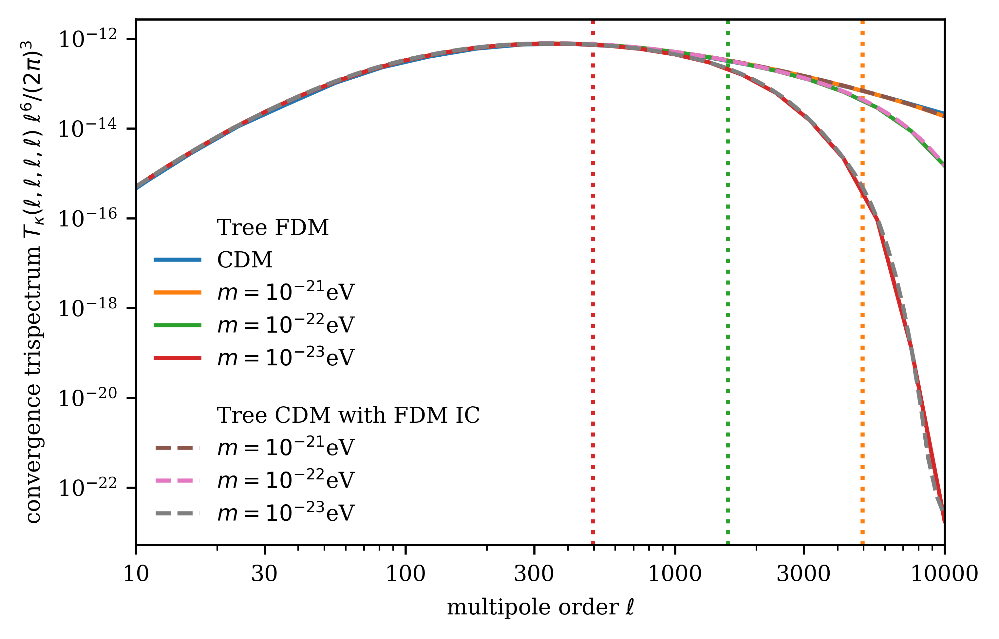

In [19]:
plt.figure(figsize=size, dpi=dpi)
import seaborn as sns 
path = "data/lensing_trispectrum/equilateral/"


plots = []

p = mlines.Line2D([0], [0], color='steelblue', ls='--',lw=0, label='Tree FDM')
plots.append(p)


files = ['fc_cdm.dat', 'fc_m21.dat', 'fc_m22.dat', 'fc_m23.dat']
labels = ["CDM", "$m = 10^{-21}$eV", "$m = 10^{-22}$eV", "$m = 10^{-23}$eV"]

for i, file in enumerate(files):
    l, Tk = np.loadtxt(path + file, unpack = True, skiprows=1)
    p, = plt.loglog(l, Tk * l**6 / (2*np.pi)**3, label=labels[i], c = colours[i])
    plots.append(p)
    if i > 0:
        plt.axvline(lj(masses[i-1]), c=colours[i], ls = "dotted")

p = mlines.Line2D([0], [0], color='steelblue', ls='--',lw=0, label='\nTree CDM with FDM IC')
plots.append(p)

files = ["fc_cdm_m21.dat", "fc_cdm_m22.dat", "fc_cdm_m23.dat"]
for i, file in enumerate(files):
    l, Tk = np.loadtxt(path + file, unpack = True, skiprows=1)
    p, = plt.loglog(l, Tk * l**6 / (2*np.pi)**3, c = f"C{i+5}", label=labels[i+1], ls = "dashed")
    plots.append(p)


plt.xlabel(r"multipole order $\ell$")
plt.ylabel(r"convergence trispectrum $T_{\kappa}(\ell, \ell, \ell, \ell)$ $\ell^6/(2\pi)^3$")
aux = [10, 30,100,300,1000,3000,10000]
plt.xticks(aux,aux)
plt.xlim(10, 10000)
leg = plt.legend(handles = plots, loc="lower left")
leg.get_frame().set_linewidth(0.0)
plt.savefig("../figures/fdm_ic_equilateral_convergence_trispectrum.pdf", bbox_inches='tight')
plt.show()


## $\chi^2$ for distinguishing CDM and FDM 

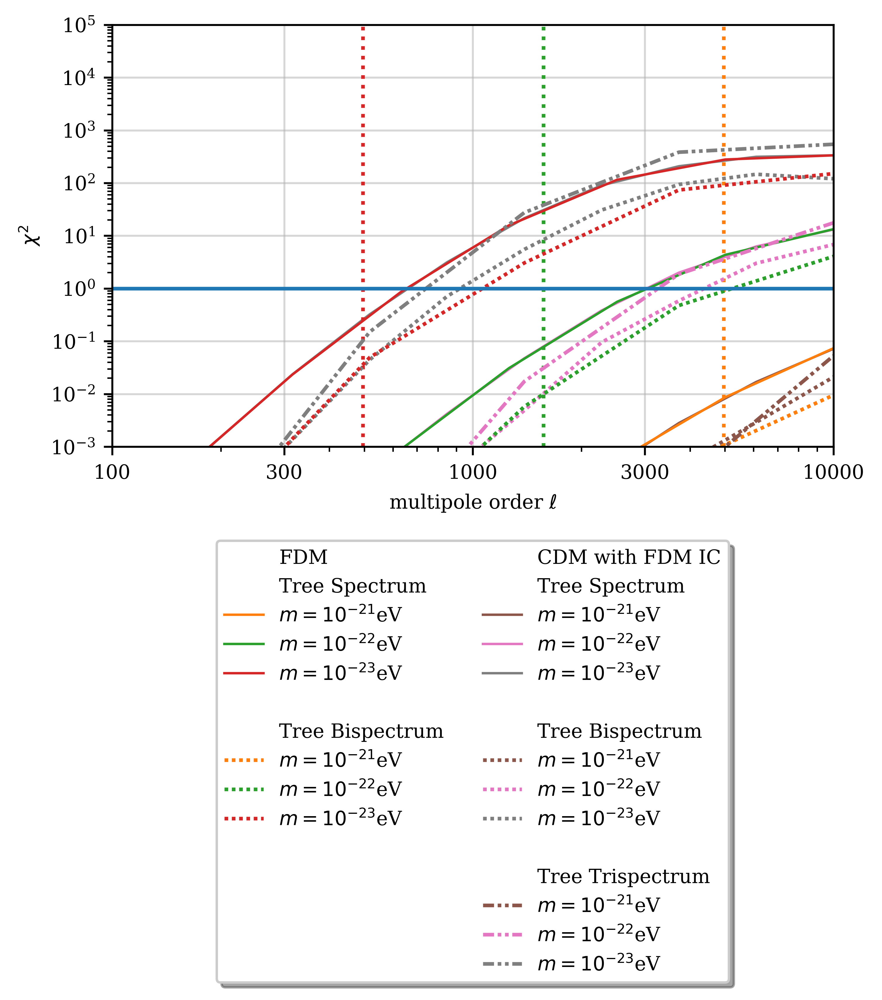

In [29]:
fig, ax = plt.subplots(figsize=size, dpi = dpi)

cdm_fdm_ic_plots = []
fdm_plots = []

labels = ["$m = 10^{-21}$eV",
          "$m = 10^{-22}$eV", 
          "$m = 10^{-23}$eV"]

path   = "data/lensing_spectrum/chi_squared/"

p = mlines.Line2D([0], [0], color='steelblue', ls='--',lw=0, label='CDM with FDM IC')
cdm_fdm_ic_plots.append(p)
p = mlines.Line2D([0], [0], color='steelblue', ls='--',lw=0, label='Tree Spectrum')
cdm_fdm_ic_plots.append(p)

files  = [  '1_fc_cdm_m21.dat', 
            '1_fc_cdm_m22.dat', 
            '1_fc_cdm_m23.dat']

for i, file in enumerate(files):
    l, chisq = np.loadtxt(path + file, unpack = True)
    p, = plt.loglog(l, chisq, label=labels[i], c = f"C{i+5}", lw = 1)
    cdm_fdm_ic_plots.append(p)


#p = mlines.Line2D([0], [0], color='steelblue', ls='--',lw=0, label='Loop Spectrum')
#cdm_fdm_ic_plots.append(p)
#
#files  = ['1_fc_cdm_m21_loop.dat',
#          '1_fc_cdm_m22_loop.dat',
#          '1_fc_cdm_m23_loop.dat']
#
#
#for i, file in enumerate(files):
#    l, chisq = np.loadtxt(path + file, unpack = True)
#    p, = plt.loglog(l, chisq, label=labels[i], c = f"C{i+5}", lw = 2, ls="solid")
#    cdm_fdm_ic_plots.append(p)

p = mlines.Line2D([0], [0], color='steelblue', ls='--',lw=0, label='FDM')
fdm_plots.append(p)
p = mlines.Line2D([0], [0], color='steelblue', ls='--',lw=0, label='Tree Spectrum')
fdm_plots.append(p)

path   = "data/lensing_spectrum/chi_squared/"

files  = [  '1_fdm_m21_unified.dat', 
            '1_fdm_m22_unified.dat', 
            '1_fdm_m23_unified.dat']

for i, file in enumerate(files):
    l, chisq = np.loadtxt(path + file, unpack = True)
    p, = plt.loglog(l, chisq, label=labels[i], c = colours[i+1], lw = 1)
    fdm_plots.append(p)
    plt.axvline(k2l(zmean, li_kj(a0, masses[i])), c = colours[i+1], ls = "dotted")

createDummyLabels(fdm_plots, 1)
#p = mlines.Line2D([0], [0], color='steelblue', ls='--',lw=0, label='Loop Spectrum')
#fdm_plots.append(p)
#
#files  = [  '1_fdm_m21_spline.dat',
#            '1_fdm_m22_spline.dat',
#            '1_fdm_m23_spline.dat']
#
#for i, file in enumerate(files):
#    l, chisq = np.loadtxt(path + file, unpack = True)
#    p, = plt.loglog(l, chisq, label=labels[i], c = colours[i+1], lw = 2, ls="solid")
#    fdm_plots.append(p)


#p = mlines.Line2D([0], [0], color='steelblue', ls='--',lw=0, label='\nCDM with FDM IC')
#plots.append(p)
createDummyLabels(cdm_fdm_ic_plots, 1)
p = mlines.Line2D([0], [0], color='steelblue', ls='--',lw=0, label='Tree Bispectrum')
cdm_fdm_ic_plots.append(p)

path   = "data/lensing_bispectrum/chi_squared/"
files  = [  '1_fc_cdm_m21.dat', 
            '1_fc_cdm_m22.dat', 
            '1_fc_cdm_m23.dat']


for i, file in enumerate(files):
    l, chisq = np.loadtxt(path + file, unpack = True)
    p, = plt.loglog(l, np.abs(chisq), c = f"C{i+5}", label=labels[i], ls=(0, (1, 1)))
    cdm_fdm_ic_plots.append(p)

    #p = mlines.Line2D([0], [0], color='steelblue', ls='--',lw=0, label='\nFDM')
    #plots.append(p)

p = mlines.Line2D([0], [0], color='steelblue', ls='--',lw=0, label='Tree Bispectrum')
fdm_plots.append(p)

files  = [
    '1_m21_unified.dat',
    '1_m22_unified.dat',
    '1_m23_unified.dat',
]

for i, file in enumerate(files):
    l, chisq = np.loadtxt(path + file, unpack = True)
    p, = plt.loglog(l, np.abs(chisq), c = colours[i+1], label=labels[i], ls=(0, (1, 1)))
    fdm_plots.append(p)

#
#
##p = mlines.Line2D([0], [0], color='steelblue', ls='--',lw=0, label='\nCDM with FDM IC')
##plots.append(p)
#createDummyLabels(cdm_fdm_ic_plots, 1)
#p = mlines.Line2D([0], [0], color='steelblue', ls='--',lw=0, label='Tree Trispectrum')
#cdm_fdm_ic_plots.append(p)
#
#path   = "data/lensing_trispectrum/chi_squared/"
#files  = [
#    '1_fc_cdm_m21.dat',
#    '1_fc_cdm_m22.dat',
#    '1_fc_cdm_m23.dat'
#]
#
#for i, file in enumerate(files):
#    l, chisq = np.loadtxt(path + file, unpack = True)
#    p, = plt.loglog(l, np.abs(chisq), label=labels[i], c = f"C{i+5}", ls=(0, (5, 1)))
#    cdm_fdm_ic_plots.append(p)



#p = mlines.Line2D([0], [0], color='steelblue', ls='--',lw=0, label='\nOld $T_{\kappa}^{(0)}$')
#plots.append(p)
#
#path   = "../../C/data/lensing_trispectrum/chi_squared/"
#files  = [
#    '1_m21_cuba_mod.dat',
#    '1_m22_cuba_mod.dat',
#    '1_m23_cuba_mod.dat',
#]
#labels = [
#    "$T_{\kappa}^{(0)}$ $m = 10^{-21}$eV MOD",
#    "$T_{\kappa}^{(0)}$ $m = 10^{-22}$eV MOD",
#    "$T_{\kappa}^{(0)}$ $m = 10^{-23}$eV MOD",
#]
#
#for i, file in enumerate(files):
#    l, chisq = np.loadtxt(path + file, unpack = True)
#    p, = plt.loglog(l, np.abs(chisq), label=labels[i], c = colours[i + 1], ls=(0, (10, 1)))
#    plots.append(p)

createDummyLabels(cdm_fdm_ic_plots, 1)
createDummyLabels(fdm_plots, 5)
p = mlines.Line2D([0], [0], color='steelblue', ls='--',lw=0, label='Tree Trispectrum')
cdm_fdm_ic_plots.append(p)

path   = "data/lensing_trispectrum/chi_squared/"
files  = [
    '1_fc_cdm_m21.dat',
    '1_fc_cdm_m22.dat',
    '1_fc_cdm_m23.dat'
]

for i, file in enumerate(files):
    l, chisq = np.loadtxt(path + file, unpack = True)
    p, = plt.loglog(l, np.abs(chisq), label=labels[i], c = f"C{i+5}", ls=(0, (3, 1, 1, 1, 1, 1)))
    cdm_fdm_ic_plots.append(p)


plt.xlim(30, 10000)
aux = [100, 300, 1000, 3000, 10000]
plt.xticks(aux,aux)
plt.axhline(y=1, label=r"$\chi^2$ = 1", c = colours[0])
plt.ylim(1e-3, 1e5)
plt.xlim(1e2, 1e4)

plt.xlabel(r"multipole order $\ell$")
plt.ylabel(r"$\chi^2$")

plt.grid(visible=True, alpha=0.5)
fdm_plots.extend(cdm_fdm_ic_plots)
# Shrink current axis's height by 10% on the bottom
box = ax.get_position()
ax.set_position([box.x0, box.y0 + box.height * 0.1,
                 box.width, box.height * 0.9])

# Put a legend below current axis
ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2),handles = fdm_plots,
          fancybox=True, shadow=True, ncol=2)
plt.savefig("../figures/fdm_ic_chi_squared_1.pdf", bbox_inches='tight')

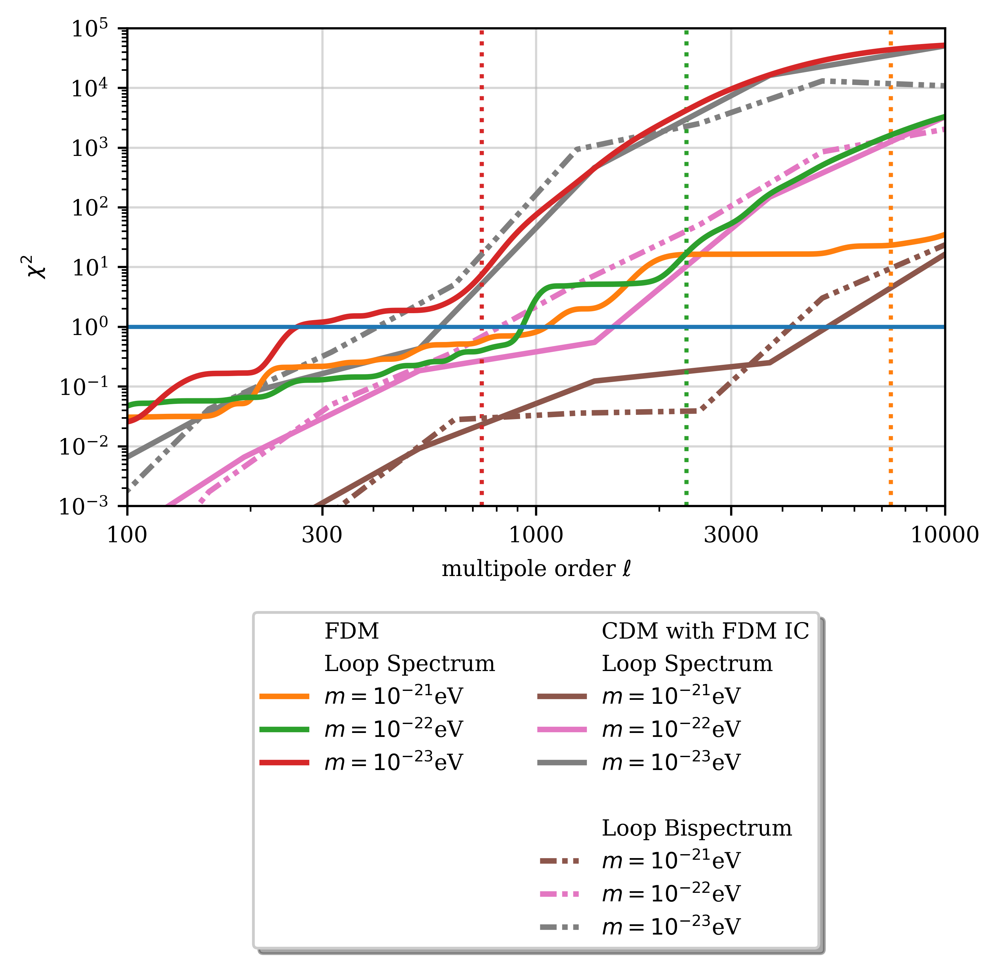

In [30]:
plotFDM = False

fig, ax = plt.subplots(figsize=size, dpi = dpi)

cdm_fdm_ic_plots = []
fdm_plots = []

labels = ["$m = 10^{-21}$eV",
          "$m = 10^{-22}$eV", 
          "$m = 10^{-23}$eV"]

path   = "data/lensing_spectrum/chi_squared/"


p = mlines.Line2D([0], [0], color='steelblue', ls='--',lw=0, label='CDM with FDM IC')
cdm_fdm_ic_plots.append(p)

#p = mlines.Line2D([0], [0], color='steelblue', ls='--',lw=0, label='Tree Spectrum')
#cdm_fdm_ic_plots.append(p)
#
#files  = [  '1_fc_cdm_m21.dat', 
#            '1_fc_cdm_m22.dat', 
#            '1_fc_cdm_m23.dat']
#
#for i, file in enumerate(files):
#    l, chisq = np.loadtxt(path + file, unpack = True)
#    p, = plt.loglog(l, chisq, label=labels[i], c = f"C{i+5}", lw = 1, ls="dashed")
#    cdm_fdm_ic_plots.append(p)
#    plt.axvline(k2l(zmean, li_kj(a0, masses[i])), c = f"C{i+5}", ls = "dotted")


p = mlines.Line2D([0], [0], color='steelblue', ls='--',lw=0, label='Loop Spectrum')
cdm_fdm_ic_plots.append(p)

files  = ['1_fc_cdm_m21_loop.dat',
          '1_fc_cdm_m22_loop.dat',
          '1_fc_cdm_m23_loop.dat']


for i, file in enumerate(files):
    l, chisq = np.loadtxt(path + file, unpack = True)
    p, = plt.loglog(l, chisq, label=labels[i], c = f"C{i+5}", lw = 2, ls="solid")
    cdm_fdm_ic_plots.append(p)
    plt.axvline(k2l(zmean, li_kj(a0, masses[i], h=1)), c = colours[i+1], ls = "dotted")

#p = mlines.Line2D([0], [0], color='steelblue', ls='--',lw=0, label='Tree Bispectrum')
#cdm_fdm_ic_plots.append(p)
#
#path   = "data/lensing_bispectrum/chi_squared/"
#files  = [  '1_fc_cdm_m21.dat', 
#            '1_fc_cdm_m22.dat', 
#            '1_fc_cdm_m23.dat']


#for i, file in enumerate(files):
#    l, chisq = np.loadtxt(path + file, unpack = True)
#    p, = plt.loglog(l, np.abs(chisq), c = f"C{i+5}", label=labels[i], ls=(0, (1, 1)))
#    cdm_fdm_ic_plots.append(p)

createDummyLabels(cdm_fdm_ic_plots, 1)

p = mlines.Line2D([0], [0], color='steelblue', ls='--',lw=0, label='Loop Bispectrum')
cdm_fdm_ic_plots.append(p)

path   = "data/lensing_bispectrum/chi_squared/"
files  = [  '1_fc_cdm_m21_loop.dat', 
            '1_fc_cdm_m22_loop.dat', 
            '1_fc_cdm_m23_loop.dat']


for i, file in enumerate(files):
    l, chisq = np.loadtxt(path + file, unpack = True)
    p, = plt.loglog(l, np.abs(chisq), c = f"C{i+5}", label=labels[i], lw= 2, ls = (0, (3, 1, 1, 1, 1, 1)))
    cdm_fdm_ic_plots.append(p)


#p = mlines.Line2D([0], [0], color='steelblue', ls='--',lw=0, label='Tree Trispectrum')
#cdm_fdm_ic_plots.append(p)
#
#path   = "data/lensing_trispectrum/chi_squared/"
#files  = [
#    '1_fc_cdm_m21.dat',
#    '1_fc_cdm_m22.dat',
#    '1_fc_cdm_m23.dat'
#]
#
#for i, file in enumerate(files):
#    l, chisq = np.loadtxt(path + file, unpack = True)
#    p, = plt.loglog(l, np.abs(chisq), label=labels[i], c = f"C{i+5}", ls=(0, (5, 1)))
#    cdm_fdm_ic_plots.append(p)


path   = "data/lensing_spectrum/chi_squared/"

p = mlines.Line2D([0], [0], color='steelblue', ls='--',lw=0, label='FDM')
fdm_plots.append(p)

p = mlines.Line2D([0], [0], color='steelblue', ls='--',lw=0, label='Loop Spectrum')
fdm_plots.append(p)

files  = [  '1_fdm_m21_spline.dat',
            '1_fdm_m22_spline.dat',
            '1_fdm_m23_spline.dat']

for i, file in enumerate(files):
    l, chisq = np.loadtxt(path + file, unpack = True)
    p, = plt.loglog(l, chisq, label=labels[i], c = colours[i+1], lw = 2, ls="solid")
    fdm_plots.append(p)

createDummyLabels(fdm_plots, 5)



plt.xlim(30, 10000)
aux = [100, 300, 1000, 3000, 10000]
plt.xticks(aux,aux)
plt.axhline(y=1, label=r"$\chi^2$ = 1", c = colours[0])
plt.ylim(1e-3, 1e5)
plt.xlim(1e2, 1e4)

plt.xlabel(r"multipole order $\ell$")
plt.ylabel(r"$\chi^2$")

plt.grid(visible=True, alpha=0.5)
# Shrink current axis's height by 10% on the bottom
box = ax.get_position()
ax.set_position([box.x0, box.y0 + box.height * 0.1,
                 box.width, box.height * 0.9])

fdm_plots.extend(cdm_fdm_ic_plots)

# Put a legend below current axis
ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2),handles = fdm_plots,
          fancybox=True, shadow=True, ncol=2)

plt.savefig("../figures/fdm_ic_chi_squared_2.pdf", bbox_inches='tight')